<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#start-modeling" data-toc-modified-id="start-modeling-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>start modeling</a></span></li></ul></div>

In [1]:

import nbimporter
from functionForModels import run_model

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from xgboost import XGBClassifier

from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn import metrics
from sklearn.metrics import plot_confusion_matrix, classification_report

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler

In [2]:
df_preds= pd.read_csv('water_data.csv')
df_target=pd.read_csv('water_targets.csv')

In [3]:
#just for EDA and graphs
merged_data=pd.concat([df_preds,df_target],axis=1,join='inner')


In [4]:
df_preds.describe()
df_preds.shape

(59400, 40)

In [5]:
print(df_preds.isna().sum())
print(df_preds.isna().sum().sum())


id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [6]:
list(df_preds['scheme_name'].unique())

['Roman',
 nan,
 'Nyumba ya mungu pipe scheme',
 'Zingibali',
 'BL Bondeni',
 'None',
 "wanging'ombe water supply s",
 'Makanj',
 'Kidabu',
 'Mashangwi',
 'Quick wins Program',
 'Komaka mandaka',
 'Sobodo Borehole Scheme',
 'Kitukuni water supply',
 'BL Mwakikoti',
 'Chalinze wate',
 'Mae pipeline',
 'UNDP',
 'Ngana water supplied scheme',
 'Itun',
 'Bomala',
 'Kirua kahe pumping water trust',
 'Misiwa',
 'Mtwango water supplied sche',
 'K',
 'Machumba estate pipe line',
 'SHIMASA',
 'wangama water supply scheme',
 'Shirimatunda Water Supply',
 'Laela group water Supp',
 'Makwale water supplied sche',
 "Nyang'hwale",
 'Njoro Water Supply',
 'Kirua kahe gravity water supply trust',
 'Olgilai pipe line',
 'Mabula mountains spr',
 'Mkongoro One',
 'Maambreni gravity water supply',
 'Mwando water supply',
 'M',
 'Kaisho/Isingiro w',
 "wanging'ombe supply scheme",
 'Tove Mtwango gravity Scheme',
 'Tengeru gravity water supply',
 'Kulasi water supply',
 'Malemb',
 'Tawa',
 'Loruvani gravity 

In [7]:

merged_data['scheme_name']=merged_data['scheme_name'].fillna('no_scheme')
merged_data.shape

(59400, 42)

In [8]:
print(merged_data.isna().sum())

id                          0
amount_tsh                  0
date_recorded               0
funder                   3635
gps_height                  0
installer                3655
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                371
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting           3334
recorded_by                 0
scheme_management        3877
scheme_name                 0
permit                   3056
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity  

In [9]:

merged_data.dropna(inplace=True)
merged_data.drop(['id','longitude','latitude','waterpoint_type_group','num_private','region_code','recorded_by','scheme_name','subvillage','quantity_group','source_class','source_type','lga','payment','payment_type','management_group','ward','extraction_type_group','extraction_type_class','quality_group','date_recorded','wpt_name'],axis=1,inplace=True)

In [10]:
merged_data.head()
# print(merged_data['lga'].unique())
# print(merged_data['ward'].unique())

# print(merged_data['recorded_by'].unique()) one group ojnly get rid

# print(merged_data['scheme_management'].unique())
# print(list(merged_data['scheme_name'].unique()))  get rid of scheme name evne tho it may be usefull there is to much random names and they seem to be after the names of the location, 
# that the specific company is in but does not change the fact that it is the same comapny most likly same team. can come back
# and look at this laterS

# print(merged_data['source_type'].unique())
# print(merged_data['source_class'].unique())
# print(merged_data['source'].unique())
# took the source it has more details rest of them can go

# print(merged_data['management_group'].unique())

,amount_tsh,funder,gps_height,installer,basin,region,district_code,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,water_quality,quantity,source,waterpoint_type,status_group
0,6000.0,Roman,1390,Roman,Lake Nyasa,Iringa,5,109,True,VWC,False,1999,gravity,vwc,soft,enough,spring,communal standpipe,functional
2,25.0,Lottery Club,686,World vision,Pangani,Manyara,4,250,True,VWC,True,2009,gravity,vwc,soft,enough,dam,communal standpipe multiple,functional
3,0.0,Unicef,263,UNICEF,Ruvuma / Southern Coast,Mtwara,63,58,True,VWC,True,1986,submersible,vwc,soft,dry,machine dbh,communal standpipe multiple,non functional
5,20.0,Mkinga Distric Coun,0,DWE,Pangani,Tanga,8,1,True,VWC,True,2009,submersible,vwc,salty,enough,other,communal standpipe multiple,functional
6,0.0,Dwsp,0,DWSP,Internal,Shinyanga,3,0,True,VWC,True,0,swn 80,vwc,soft,enough,machine dbh,hand pump,non functional


In [11]:

merged_data.describe()
merged_data.shape


(48288, 19)

In [12]:
merged_data.dtypes

amount_tsh           float64
funder                object
gps_height             int64
installer             object
basin                 object
region                object
district_code          int64
population             int64
public_meeting        object
scheme_management     object
permit                object
construction_year      int64
extraction_type       object
management            object
water_quality         object
quantity              object
source                object
waterpoint_type       object
status_group          object
dtype: object

In [13]:
start_x=merged_data.drop('status_group',axis=1)
start_y=merged_data['status_group']

numb_col_only=merged_data.select_dtypes(include=[np.number]).columns
ob_col_only=merged_data.select_dtypes(include=[np.object]).columns

start_x2=start_x.select_dtypes(include=[np.number]).columns
start_y2=merged_data.select_dtypes(include=[np.object]).columns

start_x.drop(ob_col_only[:-1],axis=1)

,amount_tsh,gps_height,district_code,population,construction_year
0,6000.0,1390,5,109,1999
2,25.0,686,4,250,2009
3,0.0,263,63,58,1986
5,20.0,0,8,1,2009
6,0.0,0,3,0,0
...,...,...,...,...,...
59394,500.0,351,6,89,2007
59395,10.0,1210,5,125,1999
59396,4700.0,1212,4,56,1996
59398,0.0,0,4,0,0


<ipython-input-14-fe952701ff62>:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  merged_data.hist(ax= ax, bins=75);


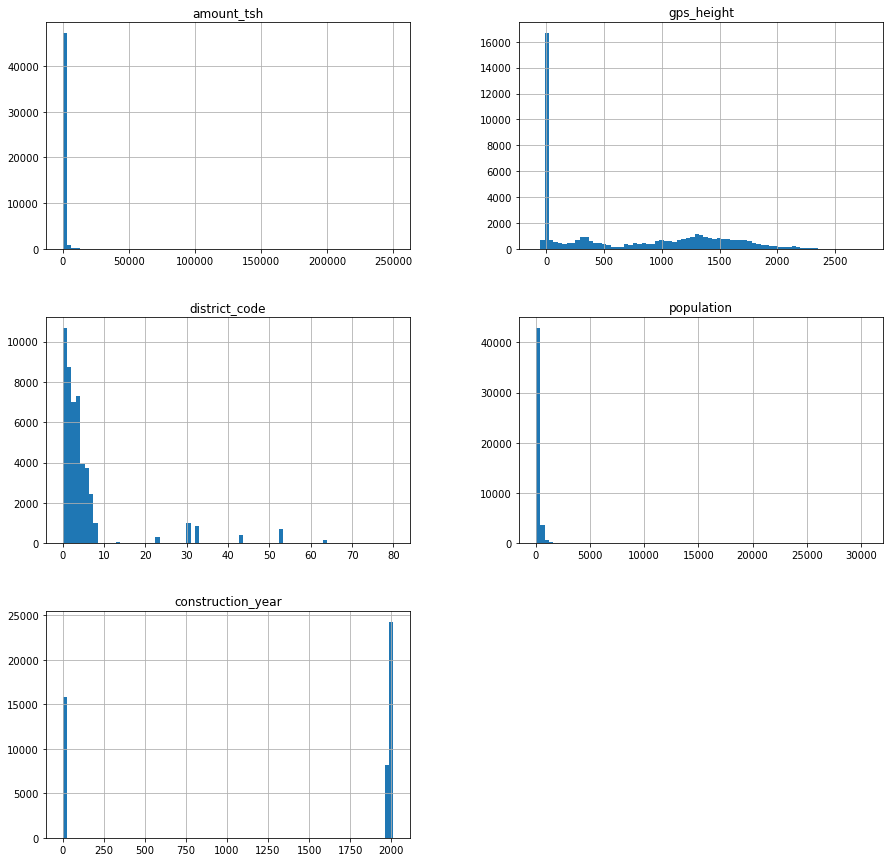

In [14]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()

merged_data.hist(ax= ax, bins=75);

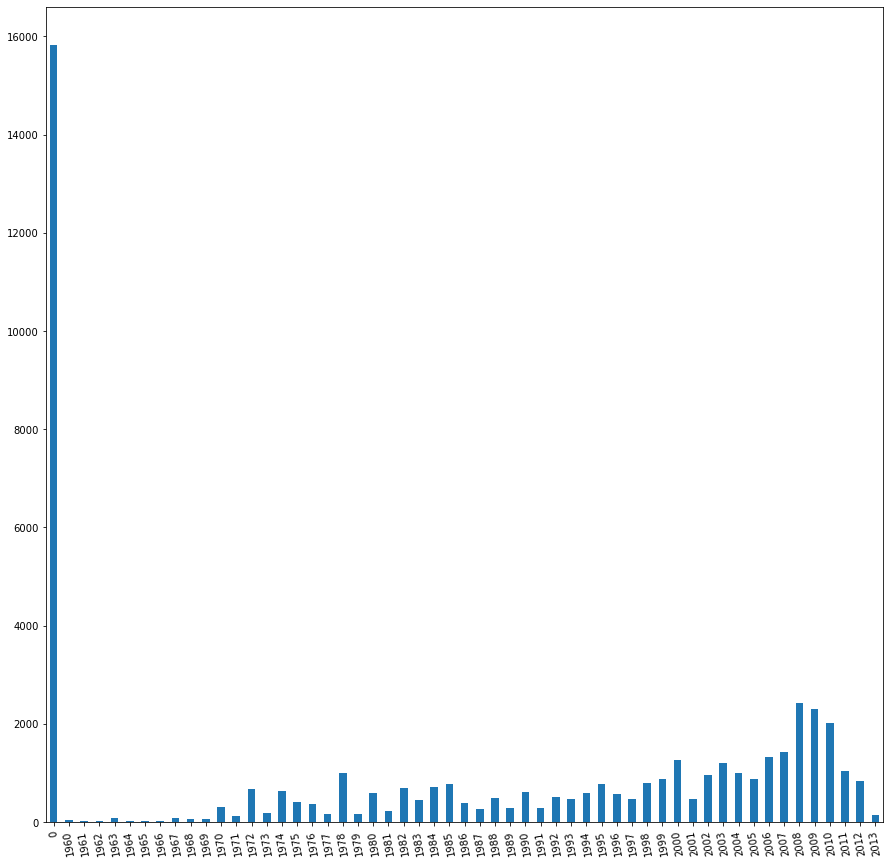

In [15]:

for item in ob_col_only:
    merged_data['construction_year'].value_counts().sort_index().plot(kind='bar',rot=100, linewidth=10, figsize = (15,15))
    plt.show()
    break

<AxesSubplot:xlabel='construction_year'>

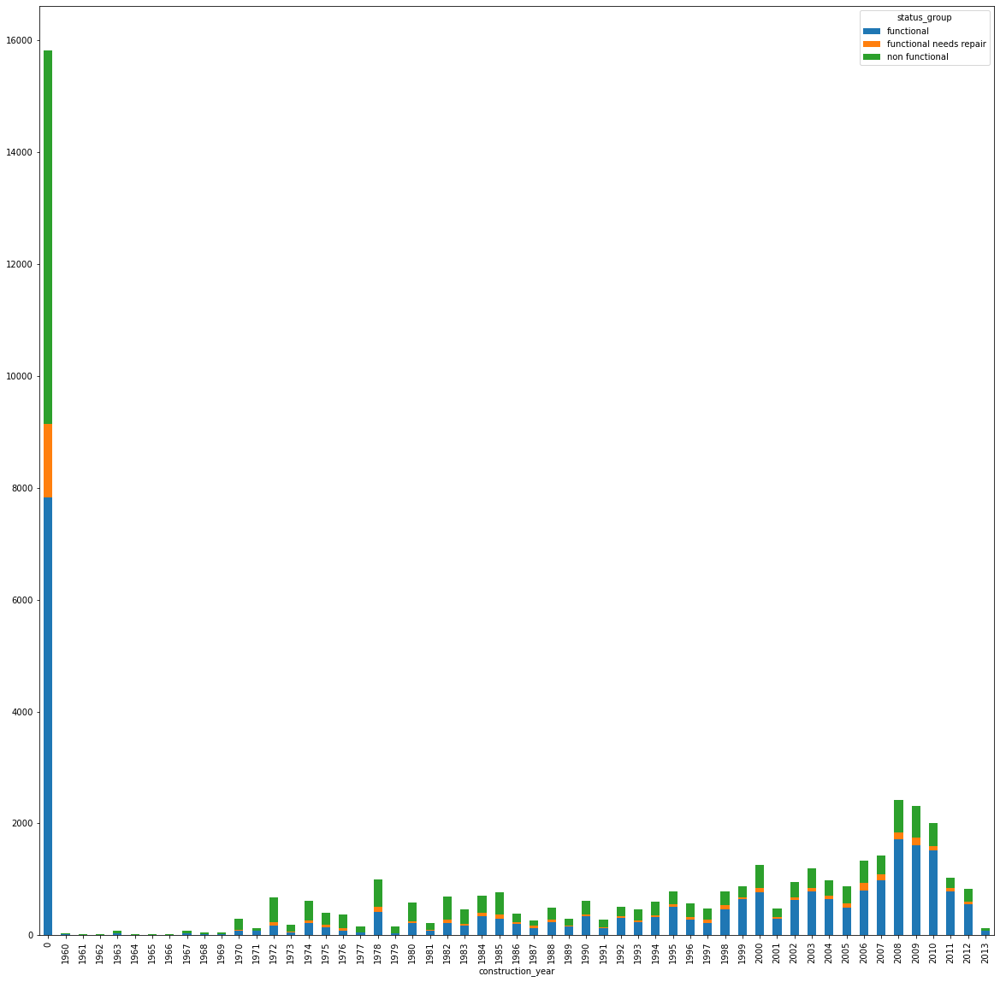

In [16]:
merged_data.groupby(['construction_year','status_group']).size().unstack()[:100].plot(kind='bar', stacked=True,figsize=(20,20))

<AxesSubplot:xlabel='funder'>

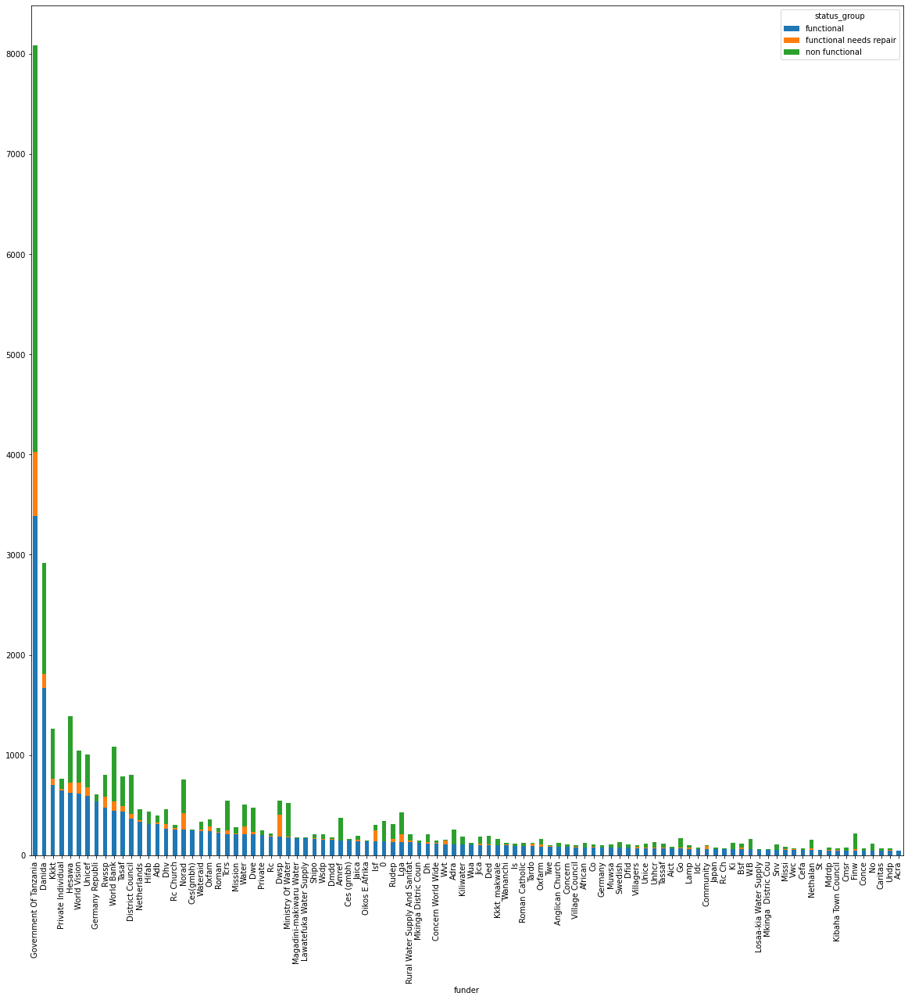

In [17]:
merged_data.groupby(['funder','status_group']).size().unstack().sort_values(by=['functional','non functional'],ascending=False)[:100].plot(kind='bar', stacked=True,figsize=(20,20))

<AxesSubplot:xlabel='funder'>

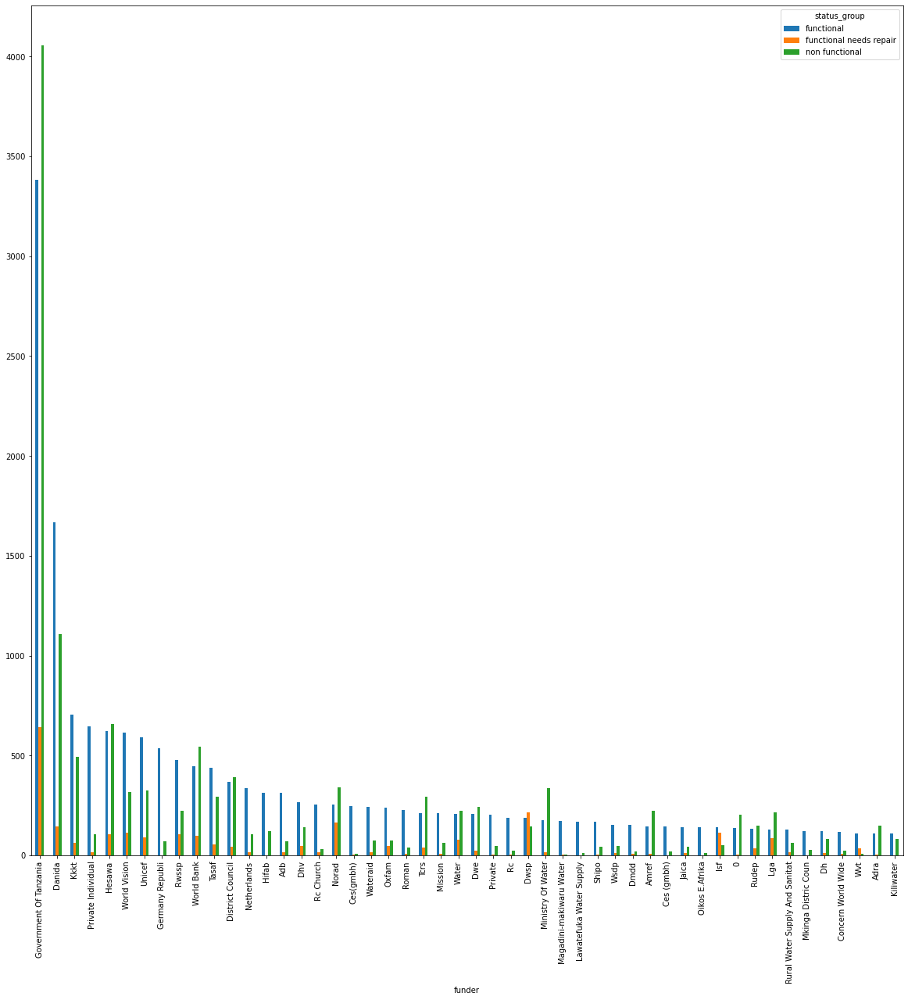

In [18]:
merged_data.groupby(['funder','status_group']).size().unstack().sort_values(by=['functional','non functional'],ascending=False)[:50].plot(kind='bar',figsize=(20,20))

as you can see that gov of tazania is the largest provider but there are some pretty significant companies and organizations.

In [19]:
merged_data.groupby(['funder','status_group']).size().unstack()#.sort_values(by=['non functional','functional'],ascending=False)[:100].plot(kind='bar', stacked=True,figsize=(20,20))

status_group,functional,functional needs repair,non functional
funder,,,
0,138.0,3.0,203.0
A/co Germany,7.0,1.0,7.0
Aar,22.0,4.0,6.0
Abas Ka,1.0,NaN,NaN
Abasia,36.0,2.0,5.0
...,...,...,...
Yasini Selemani,NaN,NaN,1.0
Zaben,2.0,NaN,NaN
Zaburi And Neig,1.0,NaN,NaN


note that you ran this as in need of repair value and very few even pop up as having, you just sorted on the second parameter.

In [20]:
# maybe junk code
merged_data.groupby(by=['funder','status_group']).count()['amount_tsh'][:10].reset_index()#.plot(kind='bar',figsize=(10, 10))

,funder,status_group,amount_tsh
0,0,functional,138
1,0,functional needs repair,3
2,0,non functional,203
3,A/co Germany,functional,7
4,A/co Germany,functional needs repair,1
5,A/co Germany,non functional,7
6,Aar,functional,22
7,Aar,functional needs repair,4
8,Aar,non functional,6
9,Abas Ka,functional,1


below:   you forgot , this is just checking the number of each predictor to see which are more common, as we can see funtional repair is very sparce in this data set. 
note go back and check and see how many of each before you split the data

In [21]:
merged_data.groupby(by=['status_group']).count().iloc[:3,:1]

,amount_tsh
status_group,
functional,26517
functional needs repair,3498
non functional,18273


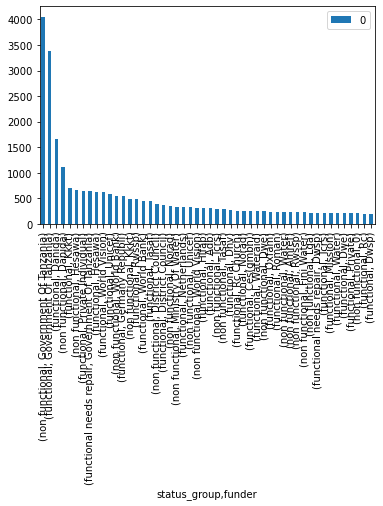

In [22]:
pd.DataFrame(merged_data[['status_group','funder']].value_counts())[:50].plot(kind='bar')
plt.show()

noticed that i started to have some issues with the date values when charting so i decided to just bin them by year. there is a strange pattern with the first part of the year i assume having more projects started and completed as they trail off into end of year. it is just the date the row was added i do not think that would hold to much interperable information.

In [23]:
ob_col_only

Index(['funder', 'installer', 'basin', 'region', 'public_meeting',
       'scheme_management', 'permit', 'extraction_type', 'management',
       'water_quality', 'quantity', 'source', 'waterpoint_type',
       'status_group'],
      dtype='object')

changing year data so it is just the year, and not the interyear information seems like to much detail.

In [24]:
# merged_data['date_recorded']=merged_data['date_recorded'].map(lambda x:x[:4])
# merged_data['date_recorded'].unique()

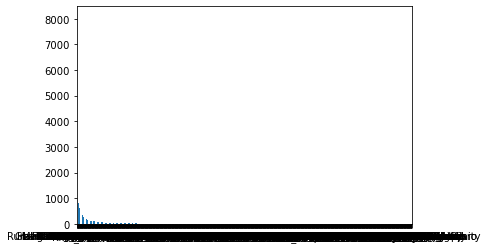

In [25]:
# merged_data[ob_col_only].value_counts().plot(kind='bar')

for item in ob_col_only:
    merged_data[item].value_counts().plot(kind='bar',rot=0)
    
    plt.show()
    break
    

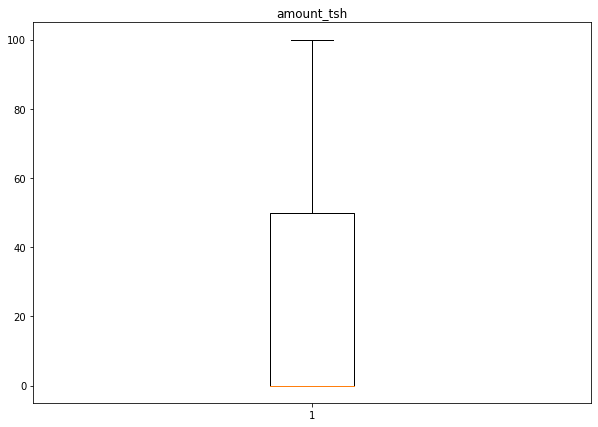

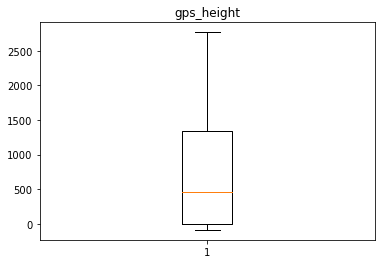

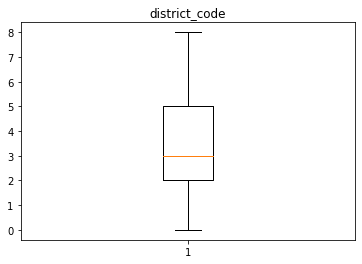

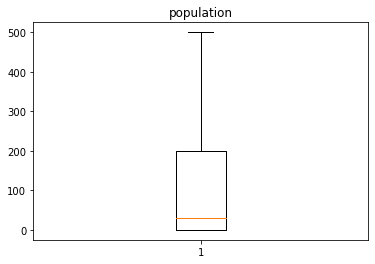

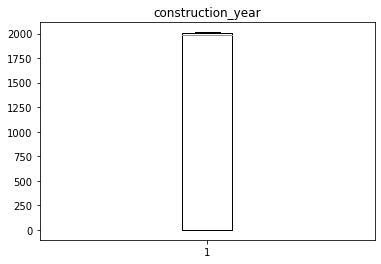

In [26]:
figbox= plt.figure(figsize=(10,7))

for item in numb_col_only:
    plt.boxplot(merged_data[item],showfliers=False)
    plt.title(item)
    plt.show()

amount_tsh


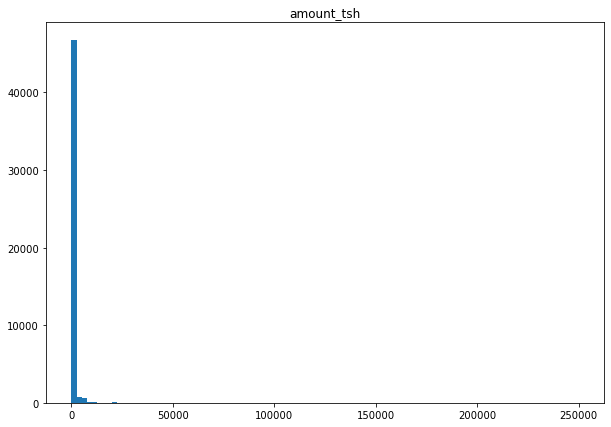

gps_height


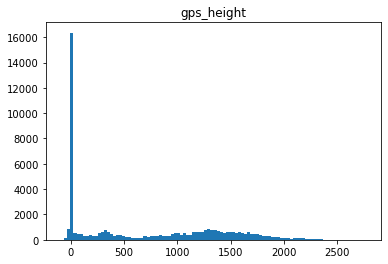

district_code


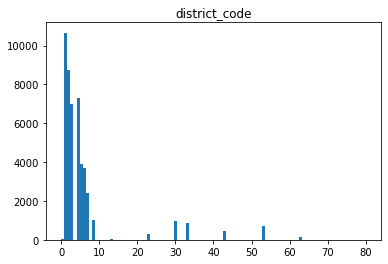

population


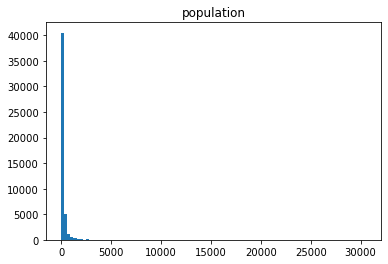

construction_year


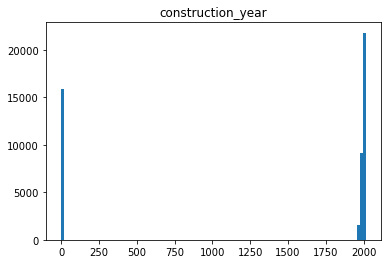

In [27]:


figbox= plt.figure(figsize=(10,7))

for item in numb_col_only:
    print(item)
    plt.hist(start_x[item],bins=100)
    plt.title(item)
    plt.show()

<AxesSubplot:xlabel='population', ylabel='Count'>

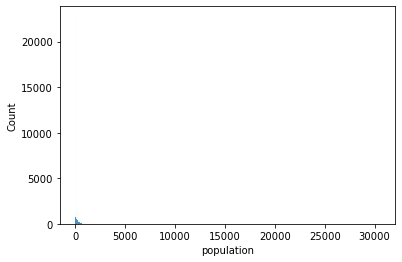

In [28]:
# plt.hist(start_x['population'][::-1],bins=10)
# plt.show()
sns.histplot(data=merged_data,x='population')

<AxesSubplot:xlabel='population'>

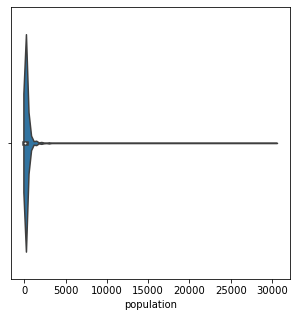

In [29]:
plt.figure(figsize=(5,5))
sns.violinplot(data=merged_data,x='population')

there was a year zero which was probably a erronos values , but there are 15k of them so I do not think we should remove them because that is a majority of my data. which may be a problem.

In [30]:
merged_data['construction_year'][merged_data['construction_year']<=1].count()

15815

Text(0.5, 1.0, 'construction_year')

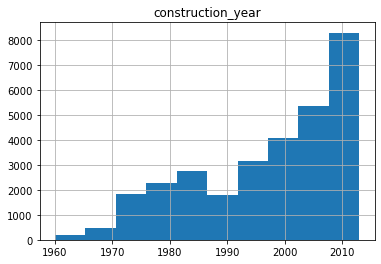

In [58]:
merged_data['construction_year'][merged_data['construction_year']>=10].hist()
plt.title('construction_year')

<AxesSubplot:>

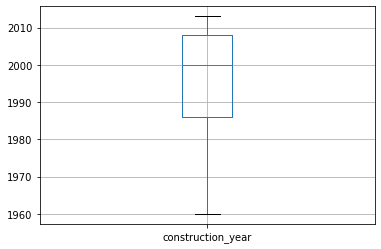

In [32]:
pd.DataFrame(merged_data['construction_year'][merged_data['construction_year']>10]).boxplot()

<AxesSubplot:xlabel='construction_year', ylabel='Count'>

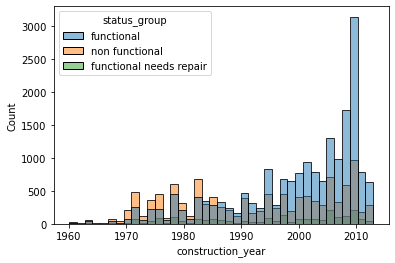

In [33]:
sns.histplot(data=merged_data[merged_data['construction_year']>10],x='construction_year',hue='status_group')

<AxesSubplot:xlabel='installer'>

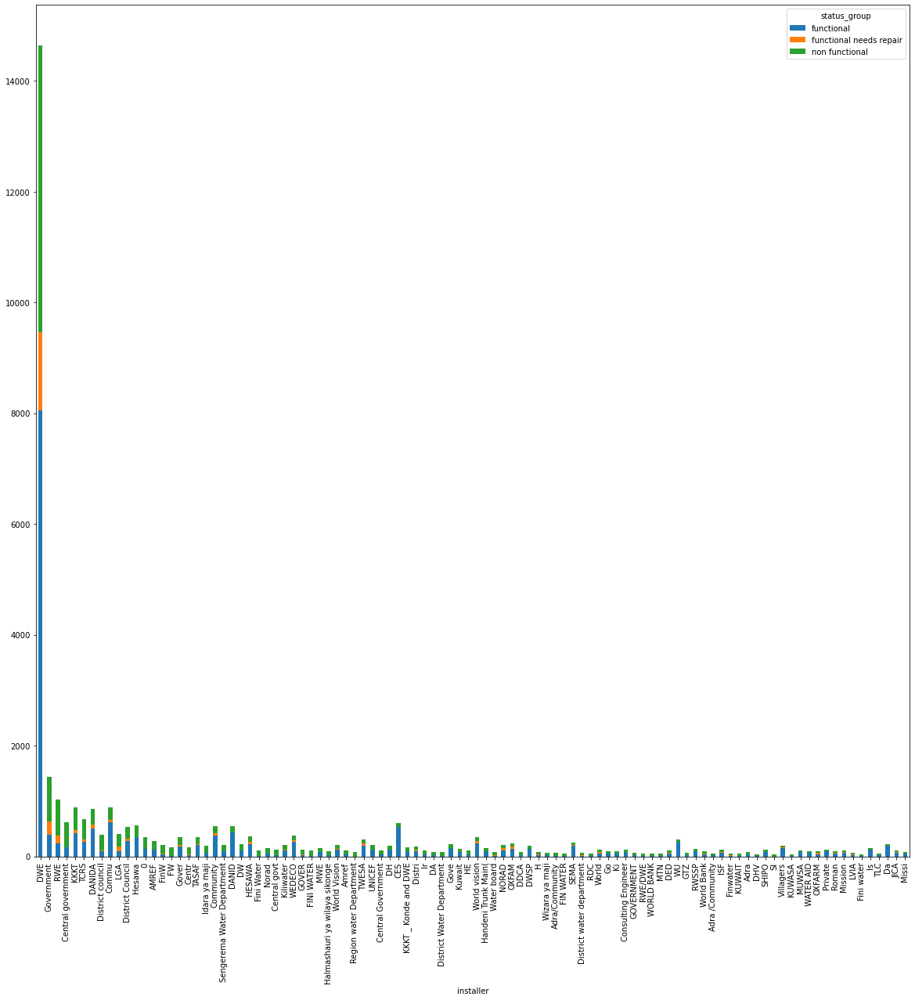

In [34]:
merged_data.groupby(['installer','status_group']).size().unstack().sort_values(by=['non functional','functional'],ascending=False)[:100].plot(kind='bar', stacked=True,figsize=(20,20))

In [35]:
merged_data.groupby(['installer']).count().sort_values(by='amount_tsh',ascending=False)

,amount_tsh,funder,gps_height,basin,region,district_code,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,water_quality,quantity,source,waterpoint_type,status_group
installer,,,,,,,,,,,,,,,,,,
DWE,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637,14637
Government,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438
RWE,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031,1031
Commu,893,893,893,893,893,893,893,893,893,893,893,893,893,893,893,893,893,893
KKKT,885,885,885,885,885,885,885,885,885,885,885,885,885,885,885,885,885,885
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ICAP,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Private Technician,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Private company,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [53]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False).mean()

population    176.599911
dtype: float64

In [54]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False)[:100]

,population
30537,30500
51398,11463
31363,10000
12784,9865
31473,9000
...,...
36844,5000
41826,5000
27088,5000
51246,5000


In [56]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False).describe()

,population
count,44790.000000
mean,176.599911
std,477.142324
min,0.000000
25%,0.000000
50%,30.000000
75%,200.000000
max,30500.000000


array([[<AxesSubplot:title={'center':'population'}>]], dtype=object)

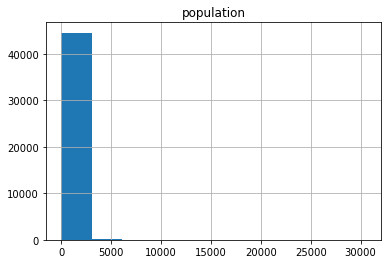

In [57]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False).hist()

<AxesSubplot:>

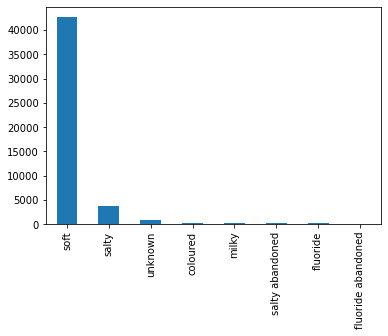

In [37]:
merged_data['water_quality'].value_counts().plot(kind='bar')

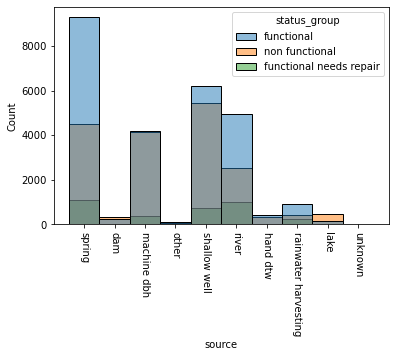

In [38]:
sns.histplot(data=merged_data,x='source',hue='status_group')
fig.tight_layout()
plt.xticks(rotation='270')
plt.show()

['spring' 'dam' 'machine dbh' 'other' 'shallow well' 'river' 'hand dtw'
 'rainwater harvesting' 'lake' 'unknown']


<AxesSubplot:>

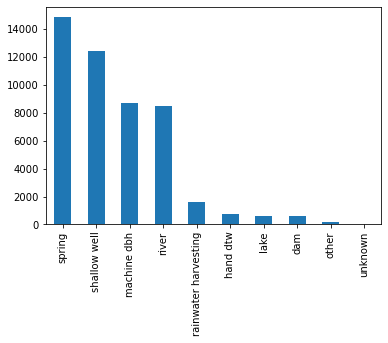

In [39]:
print(merged_data['source'].unique())
merged_data['source'].value_counts().plot(kind='bar')


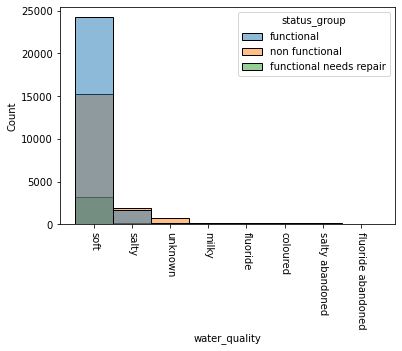

In [40]:
sns.histplot(data=merged_data,x='water_quality',hue='status_group')
fig.tight_layout()
plt.xticks(rotation='270')
plt.show()

## start modeling 

In [41]:
 from sklearn.preprocessing import OneHotEncoder

split data first do not forget, data leakage

In [42]:
merged_data[merged_data['status_group']!= 'unctional needs repair']

,amount_tsh,funder,gps_height,installer,basin,region,district_code,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,water_quality,quantity,source,waterpoint_type,status_group
0,6000.0,Roman,1390,Roman,Lake Nyasa,Iringa,5,109,True,VWC,False,1999,gravity,vwc,soft,enough,spring,communal standpipe,functional
2,25.0,Lottery Club,686,World vision,Pangani,Manyara,4,250,True,VWC,True,2009,gravity,vwc,soft,enough,dam,communal standpipe multiple,functional
3,0.0,Unicef,263,UNICEF,Ruvuma / Southern Coast,Mtwara,63,58,True,VWC,True,1986,submersible,vwc,soft,dry,machine dbh,communal standpipe multiple,non functional
5,20.0,Mkinga Distric Coun,0,DWE,Pangani,Tanga,8,1,True,VWC,True,2009,submersible,vwc,salty,enough,other,communal standpipe multiple,functional
6,0.0,Dwsp,0,DWSP,Internal,Shinyanga,3,0,True,VWC,True,0,swn 80,vwc,soft,enough,machine dbh,hand pump,non functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59394,500.0,World Bank,351,ML appro,Wami / Ruvu,Morogoro,6,89,True,VWC,True,2007,submersible,vwc,soft,enough,machine dbh,communal standpipe,non functional
59395,10.0,Germany Republi,1210,CES,Pangani,Kilimanjaro,5,125,True,Water Board,True,1999,gravity,water board,soft,enough,spring,communal standpipe,functional
59396,4700.0,Cefa-njombe,1212,Cefa,Rufiji,Iringa,4,56,True,VWC,True,1996,gravity,vwc,soft,enough,river,communal standpipe,functional
59398,0.0,Malec,0,Musa,Rufiji,Dodoma,4,0,True,VWC,True,0,nira/tanira,vwc,soft,insufficient,shallow well,hand pump,functional


In [43]:
merged_data=merged_data[merged_data['status_group']!= 'functional needs repair']

In [44]:
merged_data=merged_data[merged_data['status_group']!= 'functional needs repair']

dummy_data=pd.get_dummies(merged_data, drop_first=True)

dummy_data.head()

,amount_tsh,gps_height,district_code,population,construction_year,funder_A/co Germany,funder_Aar,funder_Abas Ka,funder_Abasia,funder_Abc-ihushi Development Cent,...,source_shallow well,source_spring,source_unknown,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other,status_group_non functional
0,6000.0,1390,5,109,1999,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
2,25.0,686,4,250,2009,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0.0,263,63,58,1986,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
5,20.0,0,8,1,2009,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0.0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


In [45]:
dummy_data.rename(columns={'status_group_non functional':'status_group'},inplace=True)
dummy_data.head()
dummy_data=dummy_data.sample(n=20000, replace=True, random_state=1)

In [46]:
len(dummy_data)

20000

In [47]:
le_x=dummy_data.drop('status_group',axis=1)
le_y=dummy_data['status_group']


X_train, X_test, y_train, y_test = train_test_split(le_x, le_y, test_size=0.25, random_state=50)

In [48]:
pd.DataFrame(y_test).columns

Index(['status_group'], dtype='object')

In [49]:
scale=StandardScaler()
scaled_data_train = scale.fit_transform(X_train)
scaled_data_test = scale.transform(X_test)

scaled_data_train = pd.DataFrame(scaled_data_train, columns=le_x.columns)
scaled_data_train.head()

,amount_tsh,gps_height,district_code,population,construction_year,funder_A/co Germany,funder_Aar,funder_Abas Ka,funder_Abasia,funder_Abc-ihushi Development Cent,...,source_river,source_shallow well,source_spring,source_unknown,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other
0,-0.106621,0.710687,-0.186445,-0.371936,0.661758,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,-0.981897,-0.351083,-0.008165,-0.632588,-0.107385,2.987842
1,-0.027519,0.941542,-0.083626,-0.234871,0.684298,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690
2,-0.106621,0.770171,-0.186445,0.754564,0.700398,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,-0.667044,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690
3,-0.106621,1.974018,-0.186445,-0.309828,0.698251,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690
4,-0.106621,1.750244,-0.392084,-0.052832,0.686444,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690


In [50]:
len(scaled_data_train)

15000

In [51]:


knn_base=KNeighborsClassifier()
tree_base=tree.DecisionTreeClassifier()
random_base=RandomForestClassifier(n_estimators=500, max_depth= 50)
log_base=LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
xboost_base=XGBClassifier()
listofmodels=[knn_base,tree_base,log_base]

# for model in listofmodels:
#     run_model(model,scaled_data_train, y_train, scaled_data_test, y_test)

              precision    recall  f1-score   support

           0       0.84      0.92      0.88      9006
           1       0.86      0.74      0.79      5994

    accuracy                           0.85     15000
   macro avg       0.85      0.83      0.84     15000
weighted avg       0.85      0.85      0.84     15000

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      2981
           1       0.80      0.69      0.74      2019

    accuracy                           0.81      5000
   macro avg       0.81      0.79      0.79      5000
weighted avg       0.81      0.81      0.80      5000


AUC is :0.79


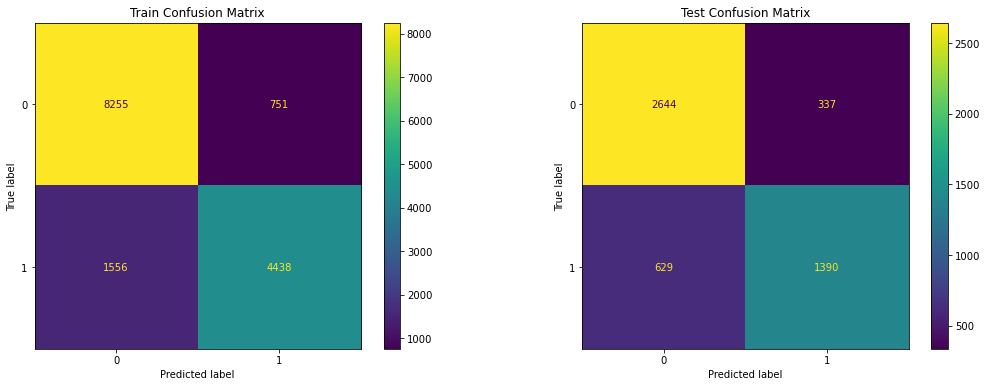

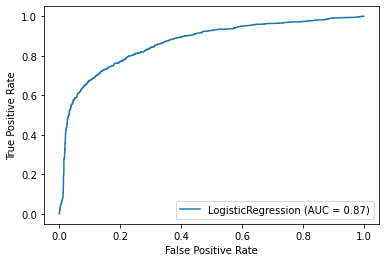

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')

In [52]:
run_model(log_base,scaled_data_train, y_train, scaled_data_test, y_test)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      9006
           1       0.99      0.96      0.97      5994

    accuracy                           0.98     15000
   macro avg       0.98      0.98      0.98     15000
weighted avg       0.98      0.98      0.98     15000

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2981
           1       0.83      0.77      0.80      2019

    accuracy                           0.84      5000
   macro avg       0.84      0.83      0.84      5000
weighted avg       0.84      0.84      0.84      5000



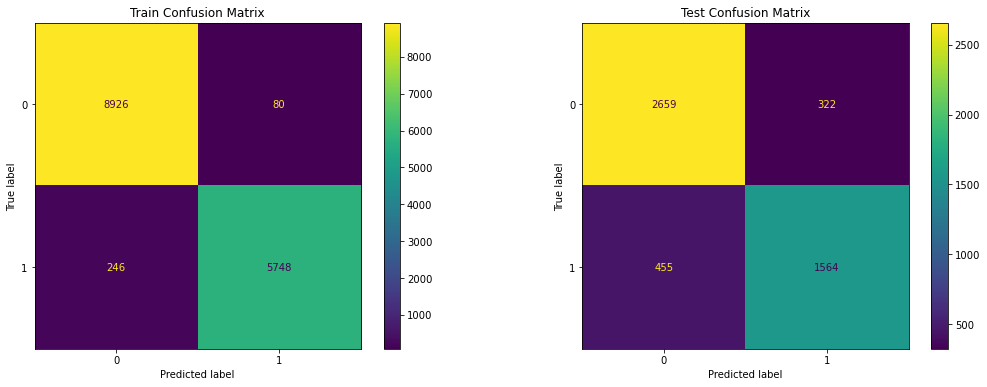

DecisionTreeClassifier()

In [53]:
run_model(tree_base,scaled_data_train, y_train, scaled_data_test, y_test)

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      9006
           1       0.84      0.78      0.81      5994

    accuracy                           0.85     15000
   macro avg       0.85      0.84      0.85     15000
weighted avg       0.85      0.85      0.85     15000

              precision    recall  f1-score   support

           0       0.81      0.85      0.83      2981
           1       0.76      0.70      0.73      2019

    accuracy                           0.79      5000
   macro avg       0.78      0.77      0.78      5000
weighted avg       0.79      0.79      0.79      5000


AUC is :0.77


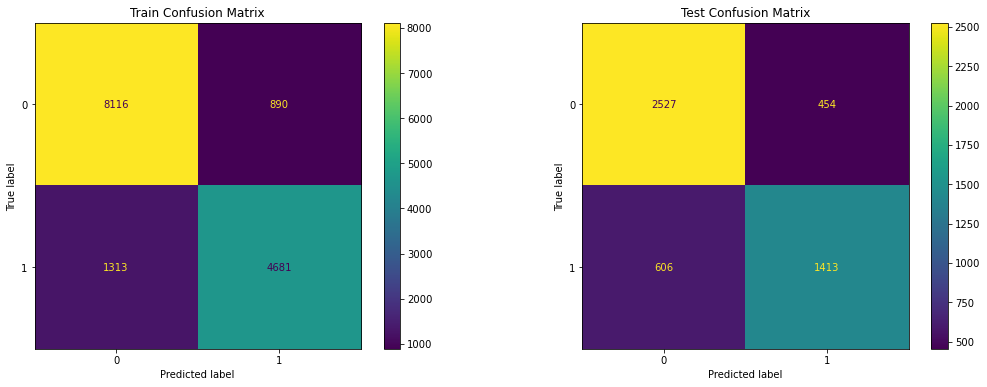

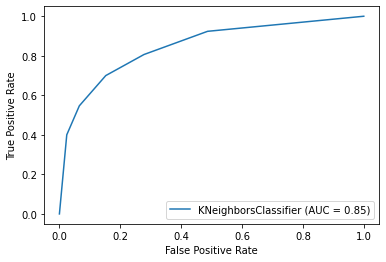

KNeighborsClassifier()

In [54]:
run_model(knn_base,scaled_data_train, y_train, scaled_data_test, y_test)

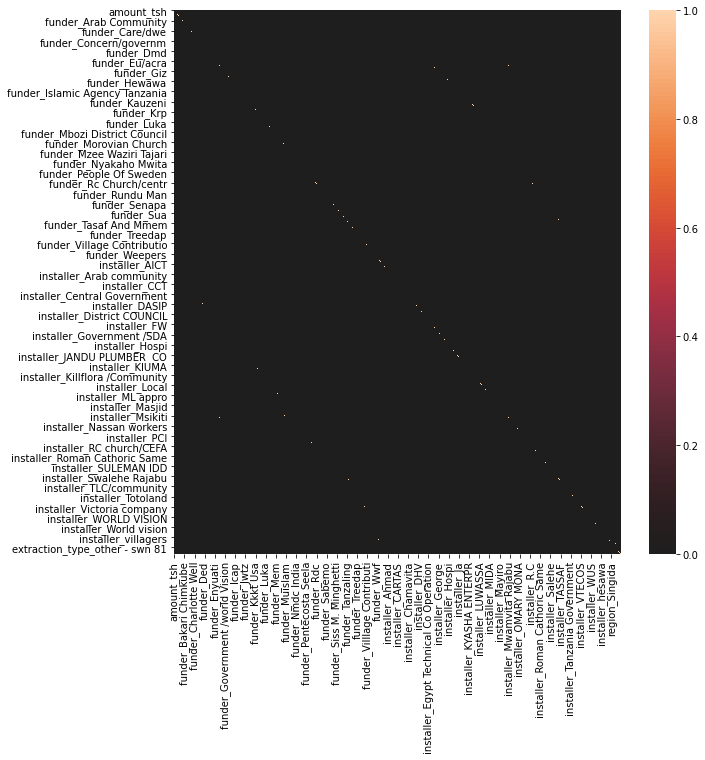

In [55]:
fig,hs = plt.subplots(figsize=(10,10))
sns.heatmap(scaled_data_train.corr()>.75, center=0);


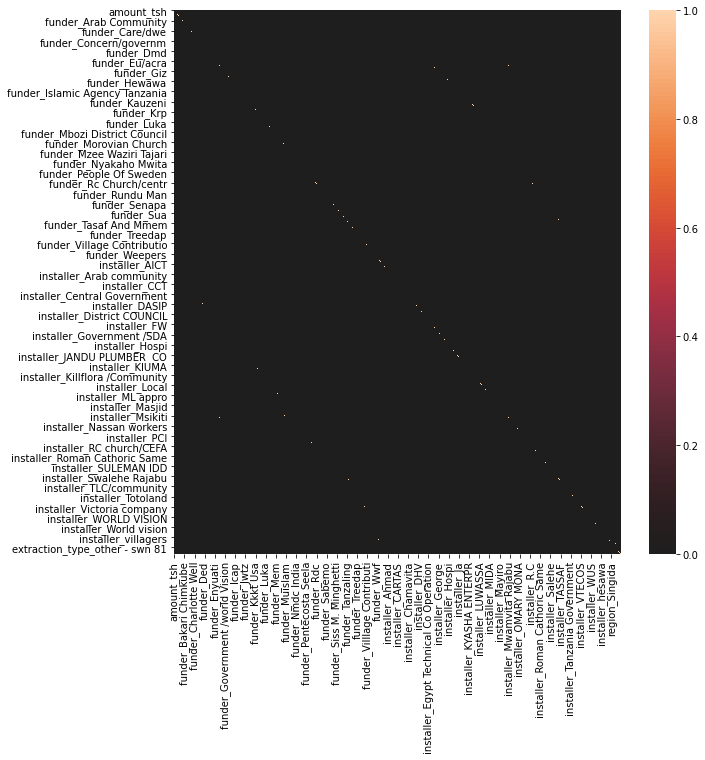

In [56]:
fig,hs = plt.subplots(figsize=(10,10))
sns.heatmap(X_train.corr()>.75, center=0);


              precision    recall  f1-score   support

           0       0.98      0.98      0.98      9006
           1       0.98      0.97      0.97      5994

    accuracy                           0.98     15000
   macro avg       0.98      0.98      0.98     15000
weighted avg       0.98      0.98      0.98     15000

              precision    recall  f1-score   support

           0       0.86      0.91      0.88      2981
           1       0.85      0.78      0.81      2019

    accuracy                           0.86      5000
   macro avg       0.85      0.84      0.85      5000
weighted avg       0.86      0.86      0.85      5000


AUC is :0.84


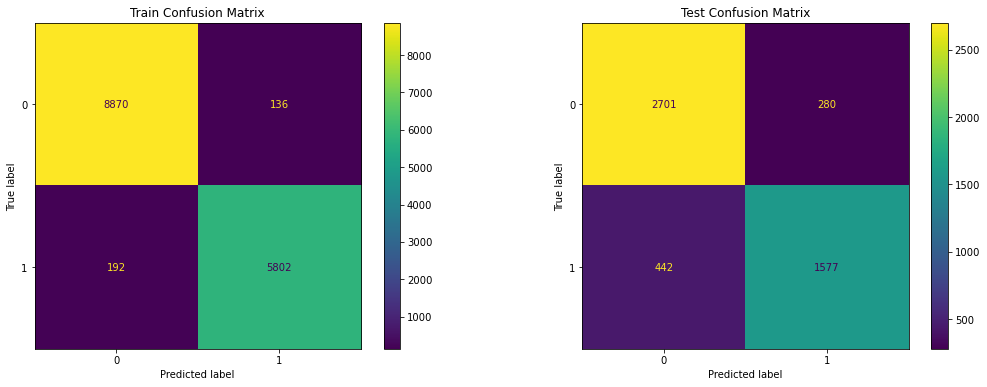

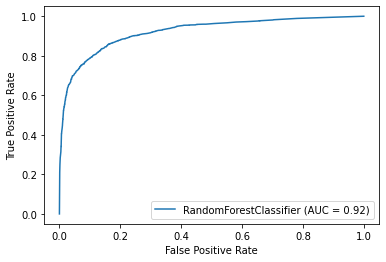

RandomForestClassifier()

In [61]:
run_model(random_base,scaled_data_train, y_train, scaled_data_test, y_test)

C:\Users\amird\Anaconda3\envs\learn-env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:12:58] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       0.86      0.95      0.91      9006
           1       0.92      0.78      0.84      5994

    accuracy                           0.88     15000
   macro avg       0.89      0.86      0.87     15000
weighted avg       0.89      0.88      0.88     15000

              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2981
           1       0.87      0.70      0.78      2019

    accuracy                           0.84      5000
   macro avg       0.85      0.82      0.83      5000
weighted avg       0.84      0.84      0.83      5000


AUC is :0.82


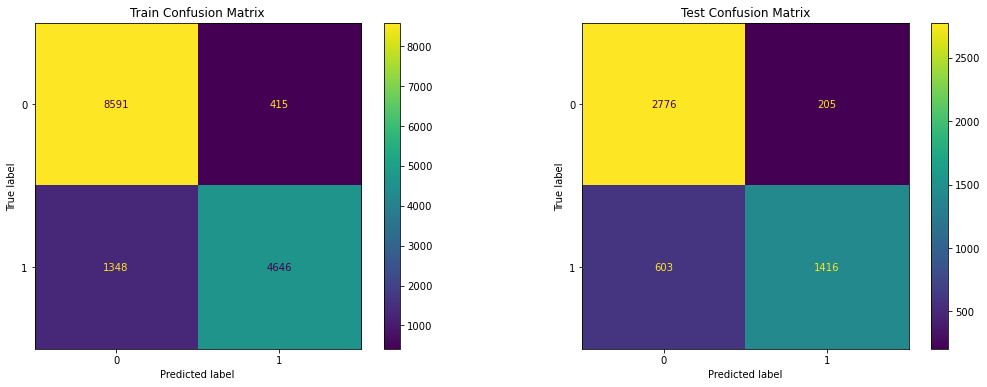

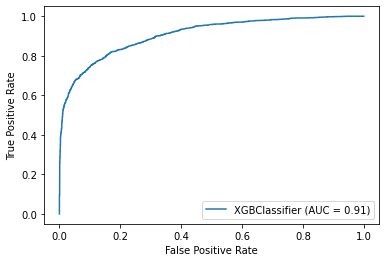

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [65]:
# scaled_data_train.columns=scaled_data_train.columns.map(lambda x : x.strip('],[<1234567890'))
# scaled_data_train.columns=scaled_data_train.columns.map(lambda x : str(x))

import re
regex = re.compile(r"\[|\]|<", re.IGNORECASE)
scaled_data_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in scaled_data_train.columns.values]



run_model(xboost_base,scaled_data_train.values, y_train, scaled_data_test, y_test)

In [ ]:
# scaled_data_train.columns=scaled_data_train.columns.map(lambda x : x.strip('],[<'))

In [ ]:
import re
regex = re.compile(r"\[|\]|<}", re.IGNORECASE)
scaled_data_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in scaled_data_train.columns.values]



In [53]:
import pickle

In [68]:
#save these files so you are not running over and overklj//\
data = [knn_base,tree_base,log_base,xboost_base,random_base]

with open('all_models.pickle','wb') as modbase:
    pickle.dump(data,modbase)

In [69]:
with open('all_models.pickle','rb') as modbase2:
    fullmodel = pickle.load(modbase2)

In [70]:
fullmodel[4]


with open('index1_models.pickle','wb') as index1:
    pickle.dump(fullmodel[0],index1)
    
with open('index2_models.pickle','wb') as index2:
    pickle.dump(fullmodel[1],index2)

with open('index3_models.pickle','wb') as index3:
    pickle.dump(fullmodel[2],index3)

with open('index4_models.pickle','wb') as index4:
    pickle.dump(fullmodel[3],index4)

with open('index5_models.pickle','wb') as index5:
    pickle.dump(fullmodel[4],index5)

In [71]:
with open('index1_models.pickle','rb') as index1:
    fstmodel = pickle.load(index1)
    
with open('index1_models.pickle','rb') as index2:
    sndmodel = pickle.load(index2)
with open('index1_models.pickle','rb') as index3:
    thrdmodel = pickle.load(index3)
with open('index1_models.pickle','rb') as index4:
    fthmodel = pickle.load(index4)
with open('index1_models.pickle','rb') as index5:
    fithmodel = pickle.load(index5)

two of the best models seems to be random forest and basic decision tree modeling but i may also do xgboost to see if we get a good result from it

In [68]:
dict_random= {
    "n_estimators":[100,500,90,80,600],
    "criterion":['gini','entropy'],
#     "max_depth":[40,50,60,70,80],
    'min_samples_split':[4,5,6,10],
#     "min_samples_leaf":[2,3,4,5,6]
}


xgboostoh={
    'n_estimators':[100,200,300],
    "gamma":[0,1,2,3,4],
    "base_score ":[.3,.5,.6],
#     "importance_type":['weight','gain','cover']
#     "max_depth":[1,2,4,6,7],
#     "grow_policy":["depthwise",'lossguide']
    
}


In [ ]:




boost_grid = GridSearchCV(xboost_base, xgboostoh, cv=4, return_train_score=True)

boost_grid.fit(scaled_data_train.values, y_train)

C:\Users\amird\Anaconda3\envs\learn-env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:18:28] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:18:29] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:19:54] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:19:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[15:58:40] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[16:00:19] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:00:21] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[16:02:02] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

In [ ]:
boost_grid.best_score_

In [ ]:
boost_grid.best_estimator_

In [ ]:
boost_grid.best_params_

In [ ]:
boost_grid.score(scaled_data_test, y_test)


In [ ]:
picklegrid1=boost_grid
with open('grid_mod1.pickle','wb') as grid1:
    pickle.dump(picklegrid1,grid1)

In [54]:
with open('grid_mod1.pickle','rb') as grid2:
    boost_grid = pickle.load(grid2)

In [69]:
random_grid = GridSearchCV(RandomForestClassifier(), dict_random, cv=2, return_train_score=True)
random_grid.fit(scaled_data_train, y_train)

GridSearchCV(cv=2, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'min_samples_split': [4, 5, 6, 10],
                         'n_estimators': [100, 500, 90, 80, 600]},
             return_train_score=True)

In [ ]:
picklegrid2=random_grid
with open('grid_mod2.pickle','wb') as grid2:
    pickle.dump(picklegrid2,grid2)

In [60]:
with open('grid_mod2.pickle','rb') as grid3:
    random_grid = pickle.load(grid3)

In [ ]:
# just placeing variables to read cause i am lost
# random_grid
# boost_grid

In [68]:
fintrain=random_grid.predict(X_train)
fintest=random_grid.predict(X_test)

print(classification_report(y_train, fintrain))
print(classification_report(y_test, fintest))

              precision    recall  f1-score   support

           0       0.60      1.00      0.75      9006
           1       0.00      0.00      0.00      5994

    accuracy                           0.60     15000
   macro avg       0.30      0.50      0.38     15000
weighted avg       0.36      0.60      0.45     15000

              precision    recall  f1-score   support

           0       0.60      1.00      0.75      2981
           1       0.00      0.00      0.00      2019

    accuracy                           0.60      5000
   macro avg       0.30      0.50      0.37      5000
weighted avg       0.36      0.60      0.45      5000



C:\Users\amird\anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [87]:
fintrain=boost_grid.predict(scaled_data_train)
fintest=boost_grid.predict(scaled_data_test)

print(classification_report(y_train, fintrain))
print(classification_report(y_test, fintest))

ValueError: Single '}' encountered in format string

['amount_tsh', 'gps_height', 'district_code', 'population', 'construction_year', 'funder_A/co Germany', 'funder_Aar', 'funder_Abas Ka', 'funder_Abasia', 'funder_Abc-ihushi Development Cent', 'funder_Abd', 'funder_Abdul', 'funder_Abood', 'funder_Abs', 'funder_Aco/germany', 'funder_Acord', 'funder_Acra', 'funder_Action Aid', 'funder_Action Contre La Faim', 'funder_Adap', 'funder_Adb', 'funder_Adf', 'funder_Adp', 'funder_Adp Bungu', 'funder_Adp Mombo', 'funder_Adp/w', 'funder_Adra', 'funder_Af', 'funder_Afdp', 'funder_Africa', 'funder_Africa 2000 Network/undp', 'funder_Africa Amini Alama', 'funder_Africa Project Ev Germany', 'funder_African', 'funder_African 2000 Network', 'funder_African Barrick Gold', 'funder_African Development Bank', 'funder_African Development Foundation', 'funder_African Muslim Agency', 'funder_African Realief Committe Of Ku', 'funder_African Reflections Foundation', 'funder_African Relie', 'funder_Africaone Ltd', 'funder_Africare', 'funder_Afya Department Lindi Rur

In [89]:
newboost=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.3, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

C:\Users\amird\anaconda3\envs\learn-env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:55:03] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       0.86      0.95      0.91      9006
           1       0.92      0.78      0.84      5994

    accuracy                           0.88     15000
   macro avg       0.89      0.86      0.87     15000
weighted avg       0.89      0.88      0.88     15000

              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2981
           1       0.87      0.70      0.78      2019

    accuracy                           0.84      5000
   macro avg       0.85      0.82      0.83      5000
weighted avg       0.84      0.84      0.83      5000


AUC is :0.82


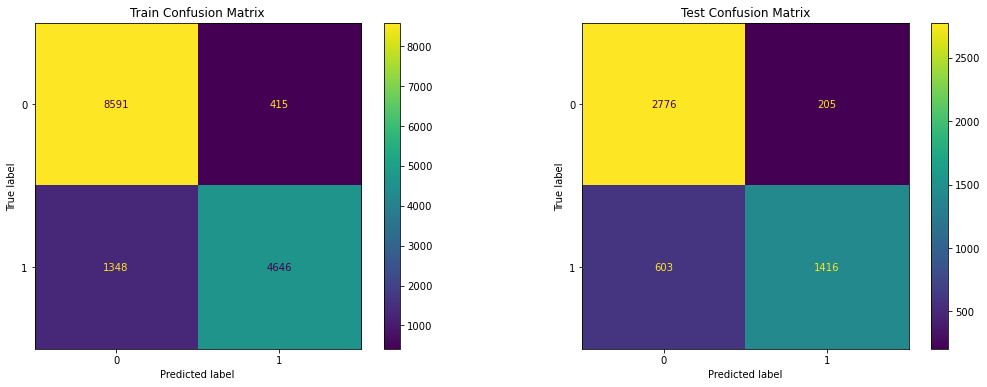

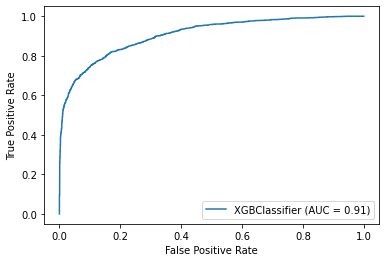

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.3, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [90]:
run_model(newboost,scaled_data_train.values, y_train, scaled_data_test, y_test)

In [74]:
 random_grid.best_score_

0.8380000000000001

In [75]:
random_grid.best_estimator_

RandomForestClassifier(criterion='entropy', min_samples_split=5,
                       n_estimators=500)

In [76]:
random_grid.best_params_

{'criterion': 'entropy', 'min_samples_split': 5, 'n_estimators': 500}

In [73]:
random_grid.scorer_

<function sklearn.metrics._scorer._passthrough_scorer(estimator, *args, **kwargs)>

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      9006
           1       0.97      0.92      0.94      5994

    accuracy                           0.96     15000
   macro avg       0.96      0.95      0.95     15000
weighted avg       0.96      0.96      0.96     15000

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      2981
           1       0.86      0.77      0.81      2019

    accuracy                           0.86      5000
   macro avg       0.86      0.84      0.85      5000
weighted avg       0.86      0.86      0.86      5000


AUC is :0.84


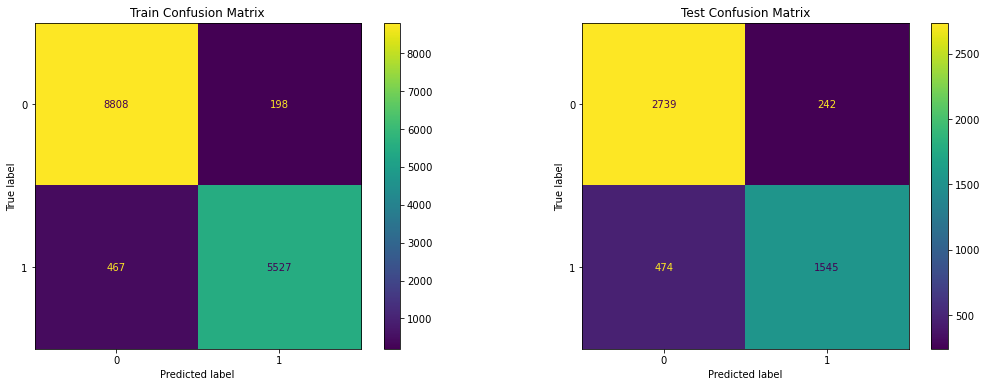

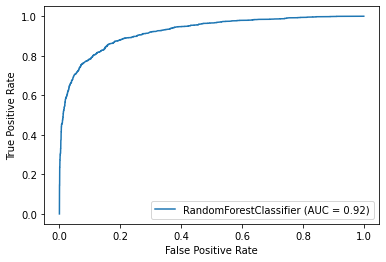

RandomForestClassifier(criterion='entropy', min_samples_split=5,
                       n_estimators=500)

In [52]:
last_random=RandomForestClassifier(criterion='entropy', n_estimators=500, min_samples_split=5)

run_model(last_random,scaled_data_train, y_train, scaled_data_test, y_test)